# **Phishing Detect Using ML**

We are going to use the Phishing_Legitimate_full dataset. since CLASS_LABEL is a category variable, this is a Classification problem. The data contains 50 features (columns) and 10000 data points (rows) .



# Import Libraries 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from __future__ import print_function

from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.datasets import fetch_california_housing
import xgboost as xgb
sns.set_style("whitegrid")

## load dataset

In [ ]:
df=pd.read_csv('Phishing_Legitimate_full.csv')

In [ ]:
df

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,...,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,1,3,1,5,72,0,0,0,0,0,...,0,0,1,1,0,1,1,-1,1,1
1,2,3,1,3,144,0,0,0,0,2,...,0,0,0,1,-1,1,1,1,1,1
2,3,3,1,2,58,0,0,0,0,0,...,0,0,0,1,0,-1,1,-1,0,1
3,4,3,1,6,79,1,0,0,0,0,...,0,0,0,1,-1,1,1,1,-1,1
4,5,3,0,4,46,0,0,0,0,0,...,1,0,0,1,1,-1,0,-1,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,3,1,1,50,0,0,0,0,0,...,0,0,0,1,1,-1,1,0,1,0
9996,9997,2,1,4,59,1,0,0,0,0,...,1,0,0,1,0,0,1,0,1,0
9997,9998,2,1,4,57,0,0,0,0,0,...,0,0,0,1,0,1,1,0,1,0
9998,9999,3,1,1,49,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0


# Explore data analysis (EDA)

Let's create some simple plots to check out the data!

In [ ]:
df.shape

(10000, 50)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 50 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   id                                  10000 non-null  int64  
 1   NumDots                             10000 non-null  int64  
 2   SubdomainLevel                      10000 non-null  int64  
 3   PathLevel                           10000 non-null  int64  
 4   UrlLength                           10000 non-null  int64  
 5   NumDash                             10000 non-null  int64  
 6   NumDashInHostname                   10000 non-null  int64  
 7   AtSymbol                            10000 non-null  int64  
 8   TildeSymbol                         10000 non-null  int64  
 9   NumUnderscore                       10000 non-null  int64  
 10  NumPercent                          10000 non-null  int64  
 11  NumQueryComponents                  10000 

In [ ]:
df.isna()

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,...,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9998,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
df.describe()

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,...,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,...,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,2.445100,0.586800,3.300300,70.264100,1.818000,0.138900,0.000300,0.013100,0.32320,...,0.339600,0.03220,0.030400,0.956600,0.020200,0.353300,0.793200,0.173400,0.314100,0.500000
std,2886.89568,1.346836,0.751214,1.863241,33.369877,3.106258,0.545744,0.017319,0.113709,1.11466,...,0.473597,0.17654,0.171694,0.248037,0.820036,0.888908,0.521019,0.755771,0.897843,0.500025
min,1.00000,1.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,2500.75000,2.000000,0.000000,2.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.000000,1.000000,-1.000000,-1.000000,1.000000,0.000000,-1.000000,0.000000
50%,5000.50000,2.000000,1.000000,3.000000,62.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.500000
75%,7500.25000,3.000000,1.000000,4.000000,84.000000,2.000000,0.000000,0.000000,0.000000,0.00000,...,1.000000,0.00000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,10000.00000,21.000000,14.000000,18.000000,253.000000,55.000000,9.000000,1.000000,1.000000,18.00000,...,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Cleaning Data &  Visualization

In [ ]:
df.rename(columns={'CLASS_LABEL': 'LABEL'}, inplace=True)

 We will toss out the id column because it not needed .




In [ ]:
df.drop('id',axis=1,inplace=True)

Here we want to find the unique value for all the features then sort them to ascending.

In [ ]:

df.LABEL.value_counts()
unique=df.nunique().sort_values(ascending=True).reset_index()
unique

,index,0
0,HttpsInHostname,1
1,LABEL,2
2,ExtFavicon,2
3,ExtFormAction,2
4,AbnormalFormAction,2
5,EmbeddedBrandName,2
6,DoubleSlashInPath,2
7,FrequentDomainNameMismatch,2
8,FakeLinkInStatusBar,2
9,RightClickDisabled,2


<AxesSubplot:>

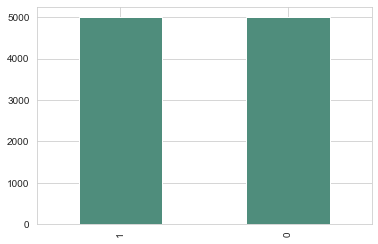

In [ ]:

df['LABEL'].value_counts().plot(kind='bar',color='#4F8D7C')

From the chart above you can see the values count of the label is a equal 


C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='NumSensitiveWords', ylabel='count'>

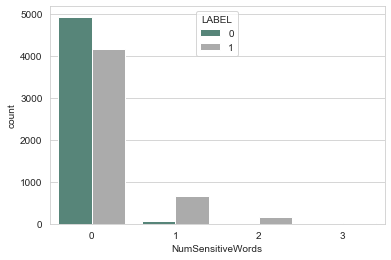

In [ ]:
#if the number of sentive word effect to the class label
colors=['#4F8D7C','#ABABAB']
sns.countplot(df.NumSensitiveWords,hue='LABEL',data=df,palette=colors)

From the above chart, we concluded the most of value in the number of sensitive words is = 0 based on the label .

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='NumDashInHostname', ylabel='count'>

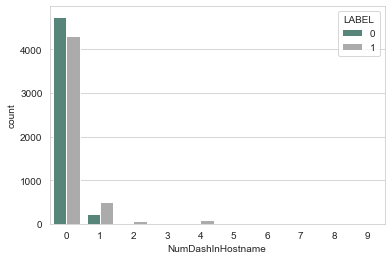

In [ ]:
colors=['#4F8D7C','#ABABAB']
sns.countplot(df.NumDashInHostname, hue='LABEL',data=df, palette=colors)
#the result when we increse the Number of Dash in the host name they cannt efficted 

From the above chart, we concluded the most value of the Numbers the dash in host name feature in class 0

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='NumHash', ylabel='count'>

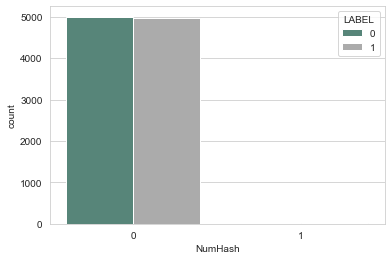

In [ ]:
colors=['#4F8D7C','#ABABAB']
sns.countplot(df.NumHash, hue='LABEL',data=df,palette=colors)

From the chart, above you can see if the Number of Hash =0 the label take two value 0 and 1, So this feature can't effected to the label.

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='UrlLengthRT', ylabel='count'>

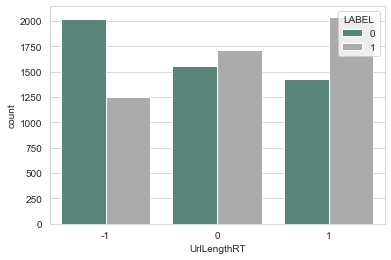

In [ ]:
colors=['#4F8D7C','#ABABAB']
sns.countplot(df.UrlLengthRT, hue='LABEL',data=df, palette=colors)

From the chart, above you can see Url Length Rt is a category feature and it has three types of value which are 0,1,-1 

# Pairplot 

In [ ]:
sns.pairplot(df,diag_kind='kde',hue='LABEL')

From the chart, above we used a pair plot to see the relationship between all features but we have 50 features, so the chart is huge.

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='NumNumericChars', ylabel='PctNullSelfRedirectHyperlinks'>

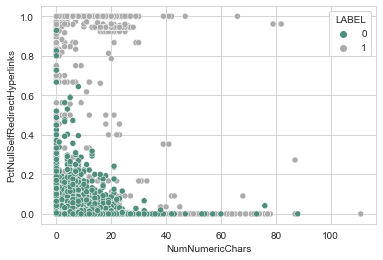

In [ ]:
colors=['#4F8D7C','#ABABAB']

sns.scatterplot( df.NumNumericChars, df.PctNullSelfRedirectHyperlinks,  hue='LABEL',data=df, palette=colors
)

From the pair plot in the figure above. we used a Scatter plot to observe and show relationships between Number numeric chars and Pct Null Self Redirect Hyperl inks. we found they have a  good impact on the label.

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='PathLength', ylabel='PctNullSelfRedirectHyperlinks'>

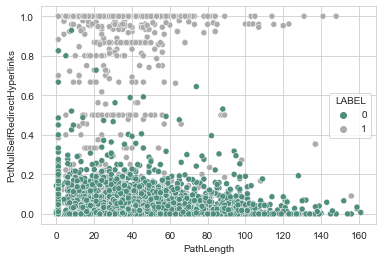

In [ ]:
colors=['#4F8D7C','#ABABAB']
sns.scatterplot(df.PathLength, df.PctNullSelfRedirectHyperlinks, hue='LABEL',data=df, palette=colors)

From the pair plot in the figure above. we used a Scatter plot to observe and show relationships between Path Length and Pct Null Self Redirect Hyperl inks . we found they have a  good impact on the label.

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='HostnameLength', ylabel='PctNullSelfRedirectHyperlinks'>

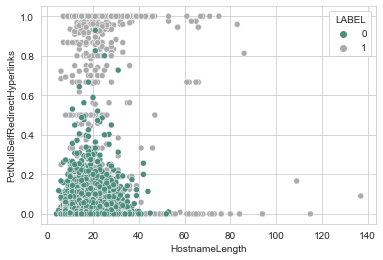

In [ ]:
colors=['#4F8D7C','#ABABAB']
sns.scatterplot(df.HostnameLength , df.PctNullSelfRedirectHyperlinks, hue='LABEL',data=df, palette=colors)

From the pair plot in the figure above. we used a Scatter plot to observe and show relationships between Hostname Length and Pct Null Self Redirect Hyperl inks .we found they have a good impact on the label. 

# Data Splitting

## Training a Classfication Models
Let's now begin to train out Classfication model! We will need to first split up our data into an X that contains the features to train on, and a y with the target variable, in this case the LABEL column.



X and y

In [ ]:
x=df.drop('LABEL',axis=1)
x

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,...,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT
0,3,1,5,72,0,0,0,0,0,0,...,0,0,0,1,1,0,1,1,-1,1
1,3,1,3,144,0,0,0,0,2,0,...,0,0,0,0,1,-1,1,1,1,1
2,3,1,2,58,0,0,0,0,0,0,...,0,0,0,0,1,0,-1,1,-1,0
3,3,1,6,79,1,0,0,0,0,0,...,1,0,0,0,1,-1,1,1,1,-1
4,3,0,4,46,0,0,0,0,0,0,...,0,1,0,0,1,1,-1,0,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,3,1,1,50,0,0,0,0,0,0,...,0,0,0,0,1,1,-1,1,0,1
9996,2,1,4,59,1,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,1
9997,2,1,4,57,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,1
9998,3,1,1,49,0,0,0,0,0,0,...,0,1,0,0,1,1,0,1,0,1


In [ ]:
y=df.LABEL
y

0       1
1       1
2       1
3       1
4       1
       ..
9995    0
9996    0
9997    0
9998    0
9999    0
Name: LABEL, Length: 10000, dtype: int64

### Train Test Split
Now let's split the data into a training set and a testing set. We will train out model on the training set and then use the test set to evaluate the model.

In [ ]:
# train test split 80%-20%
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [ ]:
x_train

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,...,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT
9254,2,1,2,41,0,0,0,0,0,0,...,0,0,0,0,1,1,1,0,1,0
1561,3,1,3,40,0,0,0,0,0,1,...,0,0,0,0,1,1,-1,1,-1,1
1670,3,0,4,53,0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,0,-1
6087,3,1,2,89,12,0,0,0,0,0,...,1,0,0,0,1,-1,1,1,1,1
6669,1,0,4,101,6,0,0,0,3,0,...,0,0,0,0,1,-1,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,2,0,1,60,0,0,0,0,0,0,...,0,0,0,0,1,0,1,1,0,1
5191,3,1,2,116,1,0,0,0,2,1,...,0,0,0,0,1,-1,1,1,1,1
5390,1,0,5,60,1,0,0,0,0,0,...,1,0,0,0,1,0,1,1,0,1
860,2,0,3,50,0,0,0,0,1,0,...,0,0,0,0,1,1,1,1,-1,1


## Feature Scaling
Feature scaling is a method used to normalize the range of independent variables or features of data in order to increase the performance of modeling

In [ ]:
# feature scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

In [ ]:
X_train_scaled

array([[-0.32813661,  0.5685909 , -0.6962499 , ..., -1.53004905,
         1.10140944, -0.34751353],
       [ 0.41467406,  0.5685909 , -0.16287834, ...,  0.39454095,
        -1.55659223,  0.76586583],
       [ 0.41467406, -0.80523187,  0.37049322, ...,  0.39454095,
        -0.22759139, -1.4608929 ],
       ...,
       [-1.07094728, -0.80523187,  0.90386478, ...,  0.39454095,
        -0.22759139,  0.76586583],
       [-0.32813661, -0.80523187, -0.16287834, ...,  0.39454095,
        -1.55659223,  0.76586583],
       [ 0.41467406,  0.5685909 , -1.22962146, ...,  0.39454095,
        -0.22759139,  0.76586583]])

In [ ]:
X_test_scaled

array([[-1.07094728, -0.80523187, -0.16287834, ...,  0.39454095,
        -0.22759139,  0.76586583],
       [ 0.41467406,  0.5685909 ,  0.90386478, ...,  0.39454095,
        -1.55659223, -1.4608929 ],
       [-1.07094728, -0.80523187, -0.16287834, ...,  0.39454095,
         1.10140944,  0.76586583],
       ...,
       [-1.07094728, -0.80523187, -1.22962146, ...,  0.39454095,
        -0.22759139,  0.76586583],
       [-1.07094728, -0.80523187,  0.37049322, ...,  0.39454095,
         1.10140944,  0.76586583],
       [-0.32813661,  0.5685909 , -0.6962499 , ...,  0.39454095,
        -0.22759139,  0.76586583]])

# Apply the Modle 


In [ ]:
# Create a function to calculate the error metrics, since we'll be doing this several times
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

def conf_matrix(actual, predicted):
    cm = confusion_matrix(actual, predicted)
    sns.heatmap(cm, xticklabels=['predicted_negative', 'predicted_positive'], 
                yticklabels=['actual_negative', 'actual_positive'], annot=True,
                fmt='d', annot_kws={'fontsize':20}, cmap="YlGnBu");

    true_neg, false_pos = cm[0]
    false_neg, true_pos = cm[1]

    accuracy = round((true_pos + true_neg) / (true_pos + true_neg + false_pos + false_neg),3)
    precision = round((true_pos) / (true_pos + false_pos),3)
    recall = round((true_pos) / (true_pos + false_neg),3)
    f1 = round(2 * (precision * recall) / (precision + recall),3)

    cm_results = [accuracy, precision, recall, f1]
    return cm_results

## Logistic Regression
Logistic Regression is a classification technique used in machine learning. It uses a logistic function to model the dependent variable. The dependent variable is dichotomous in nature, i.e. there could only be two possible classes . this technique is used while dealing with binary data.

In [ ]:
# apply logistic regression
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X_train_scaled,y_train)

LogisticRegression()

In [ ]:
y_pred_cv1 = lr.predict(X_test_scaled)

In [ ]:
y_pred_cv1

array([0, 1, 1, ..., 0, 1, 0], dtype=int64)

In [ ]:
y_test

6252    0
4684    1
1731    1
4742    1
4521    1
       ..
6412    0
8285    0
7853    0
1095    1
6929    0
Name: LABEL, Length: 2000, dtype: int64

In [ ]:
# Model evalution  by classifiction report 
from sklearn.metrics import classification_report

print(classification_report(y_pred_cv1,y_test))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       971
           1       0.95      0.93      0.94      1029

    accuracy                           0.94      2000
   macro avg       0.94      0.94      0.94      2000
weighted avg       0.94      0.94      0.94      2000



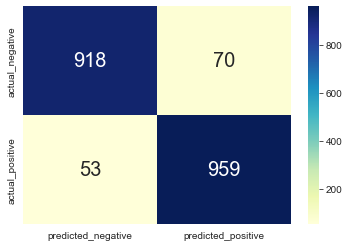

In [ ]:
# The heat map for the first logistic regression model
cm1 = conf_matrix(y_test, y_pred_cv1)

## Naive bayes classifier
Naïve Bayes is a probabilistic machine learning algorithm based on the Bayes Theorem, used in a wide variety of classification tasks.It assumes that the presence of a particular feature in a class is unrelated to the presence of any other feature. 

In [ ]:
#construct naive bayes BernoulliNB classifier
from sklearn.naive_bayes import BernoulliNB

nb = BernoulliNB()
nb.fit(X_train_scaled, y_train)
nb.score(x_test, y_test)

0.822

In [ ]:
y_pred_nb_cv2= nb.predict(X_test_scaled)

In [ ]:

from sklearn.metrics import classification_report

print(classification_report(y_pred_nb_cv2,y_test))

              precision    recall  f1-score   support

           0       0.89      0.89      0.89       994
           1       0.89      0.89      0.89      1006

    accuracy                           0.89      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.89      0.89      0.89      2000



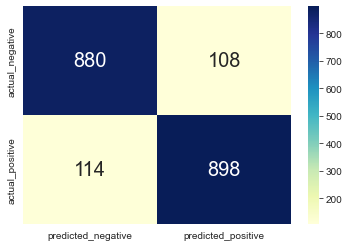

In [ ]:
# The heat map for the second naive bayes BernoulliNB classifier model 
cm2 = conf_matrix(y_test, y_pred_nb_cv2)

## Ensemble Learning – Bagging and Boosting

### Bagging

Bagging is used when the goal is to reduce the variance of a decision tree classifier. Here the objective is to create several subsets of data from training sample chosen randomly with replacement. Each collection of subset data is used to train their decision trees. As a result, we get an ensemble of different models. Average of all the predictions from different trees are used which is more robust than a single decision tree classifier. So depending on this, we applied the random forest algorithm.

#### Random Forest Classifier

Random Forest is a classifier that contains a number of decision trees on various subsets of the given dataset and takes the average to improve the predictive accuracy of that dataset

In [ ]:
# applay Random Forest
from sklearn.ensemble import RandomForestClassifier
rf= RandomForestClassifier()
rf.fit(X_train_scaled,y_train)

RandomForestClassifier()

In [ ]:
y_pred_rf_cv3= rf.predict(X_test_scaled)

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_pred_rf_cv3,y_test))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       989
           1       0.99      0.99      0.99      1011

    accuracy                           0.99      2000
   macro avg       0.99      0.99      0.99      2000
weighted avg       0.99      0.99      0.99      2000



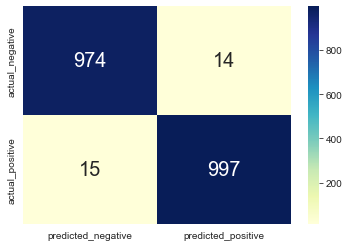

In [ ]:
# Here's the heat map third Random Forest model
cm3 = conf_matrix(y_test, y_pred_rf_cv3)

# Applying PCA

In [ ]:
#apply PCA
from sklearn.decomposition import PCA
pca = PCA(n_components = 2)
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)
X_train.shape

(8000, 2)

## Training the Logistic Regression model on the Training set

In [ ]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train, y_train)

LogisticRegression(random_state=0)

## Making the Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred_cm4 = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred_cm4 )
print(cm)
accuracy_score(y_test, y_pred_cm4)

[[547 441]
 [304 708]]


0.6275

## Model evalution  by classifiction report 

In [ ]:
# Model evalution  by classifiction report 
from sklearn.metrics import classification_report

print(classification_report(y_pred_cm4,y_test))

              precision    recall  f1-score   support

           0       0.55      0.64      0.59       851
           1       0.70      0.62      0.66      1149

    accuracy                           0.63      2000
   macro avg       0.63      0.63      0.63      2000
weighted avg       0.64      0.63      0.63      2000



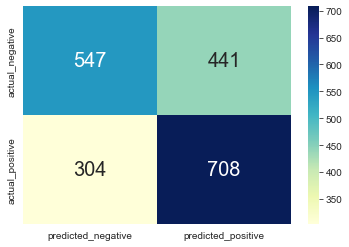

In [ ]:
cm4 = conf_matrix(y_test, y_pred_cm4)

#  Random Forest model on the Training set

In [ ]:
# applay Random Forest
from sklearn.ensemble import RandomForestClassifier
rf= RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [ ]:
y_pred_rf_cm5= rf.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_pred_rf_cm5,y_test))

              precision    recall  f1-score   support

           0       0.76      0.70      0.73      1077
           1       0.68      0.75      0.71       923

    accuracy                           0.72      2000
   macro avg       0.72      0.72      0.72      2000
weighted avg       0.73      0.72      0.72      2000



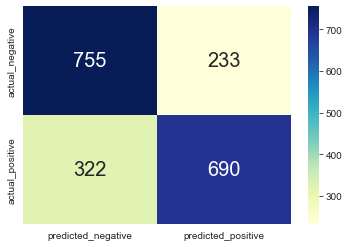

In [ ]:
cm5 = conf_matrix(y_test, y_pred_rf_cm5)

## Summary 

Finally, in this project, we used three model to detect phishing happens based on 50 features extracted from 5000 phishing,
 Then we discovered the Random Forest algorithm for machine learning is the best algorithm that detects phishing happens. Besed on the accurcy factor we getting %98 in the Random Forset model  ,93% for logistic regression model,  and 88% in the naive bayes model . And because we have a large number of the features,  So we used the Feature Scaling technique, which in turn contributed to raising the level of performance of the models and we obtained high  accuracy in the results . Then we use the PCA technique which reduces the number of features until we get the most important features, but it did not give us good results.

In [ ]:

# Compile all of the error metrics into a dataframe for comparison
results = pd.DataFrame(list(zip(cm1, cm2,cm3,cm4,cm5)))
results = results.set_index([['Accuracy', 'Precision', 'Recall', 'F1 Score']])
results.columns = ['logistic regression', 'naive bayes','Random Forest','logistic regression with PCA','Random Forest with PCA']
results

,logistic regression,naive bayes,Random Forest,logistic regression with PCA,Random Forest with PCA
Accuracy,0.938,0.889,0.986,0.628,0.722
Precision,0.932,0.893,0.986,0.616,0.748
Recall,0.948,0.887,0.985,0.700,0.682
F1 Score,0.940,0.890,0.985,0.655,0.713
